# Why are credit card customers leaving ?

# Attrition Prediction

**This dataset consists of 10,000 customers mentioning their age, salary, marital_status, credit card limit, credit card category, etc. There are nearly 18 features**

In [105]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from numpy import mean
from numpy import std

In [130]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
    
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import precision_score
from sklearn.metrics import accuracy_score
from sklearn import metrics

from xgboost import XGBClassifier

from imblearn.pipeline import Pipeline as imbpipeline
from imblearn.over_sampling import SMOTE

In [3]:
df=pd.read_csv('BankChurners.csv')
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [5]:
df.shape

(10127, 23)

In [11]:
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

**Dropping the last 2 columns**

In [12]:
cols = np.arange(21, df.shape[1])
df.drop(df.columns[cols], axis=1, inplace = True)
df.describe()

display(df.head(5))

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [56]:
#drop also the customer number
df.drop(columns =["CLIENTNUM"] , inplace = True)

In [57]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


In [15]:
df.isnull().sum()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

# EDA

**Categorical**

In [17]:
df['Attrition_Flag'].value_counts()

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64

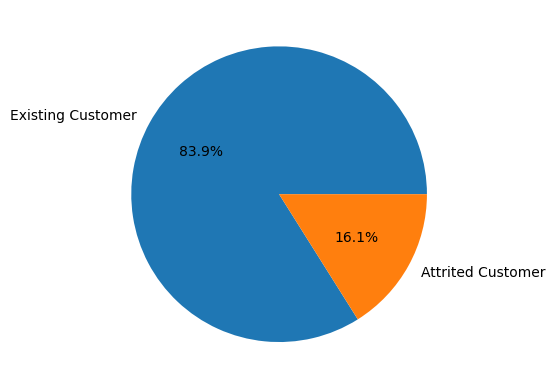

In [48]:
piechart = plt.pie(x = df['Attrition_Flag'].value_counts(), labels = df['Attrition_Flag'].value_counts().keys(),
                  autopct = "%.1f%%")

**It's an under sampled dataset**

In [59]:
# define churn as 1 and 0 (yes or no)
df["Churn"] = np.where(df["Attrition_Flag"] == "Attrited Customer", 1, 0)
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Churn
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0


<AxesSubplot: title={'center': 'Education Level'}>

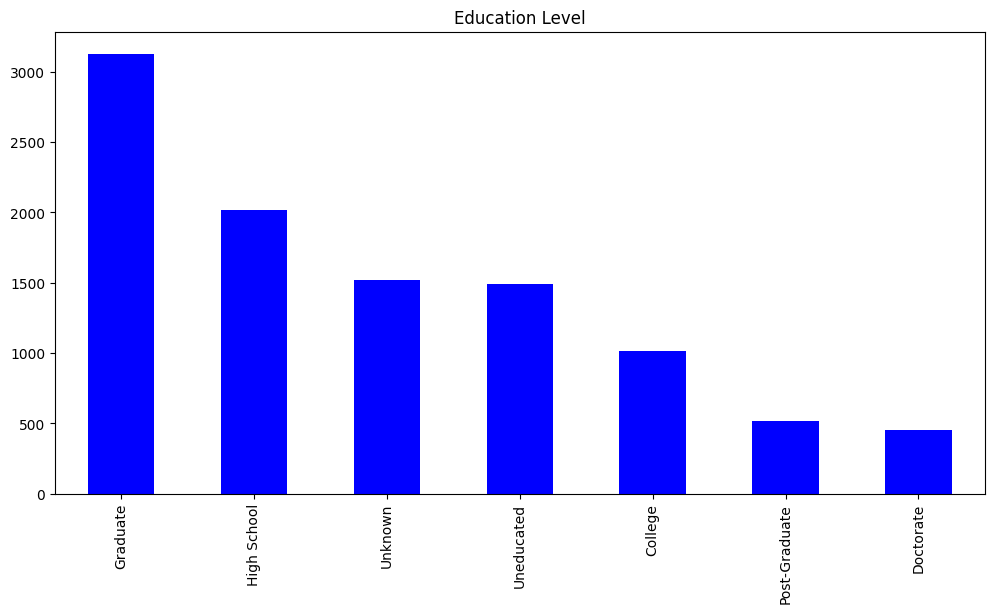

In [24]:
plt.figure(figsize=(12, 6))
df['Education_Level'].value_counts().plot(kind="bar", color="Blue", title="Education Level")

In [26]:
px.pie(df.Marital_Status,
       labels = df.Marital_Status.value_counts().index,
       values = df.Marital_Status.value_counts().values,
       names = df.Marital_Status.value_counts().index,
       title = "Marital Status"
      )

C:\Python\Python311\Lib\site-packages\plotly\express\_core.py:137: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  return args["labels"][column]


<AxesSubplot: title={'center': 'Gender'}>

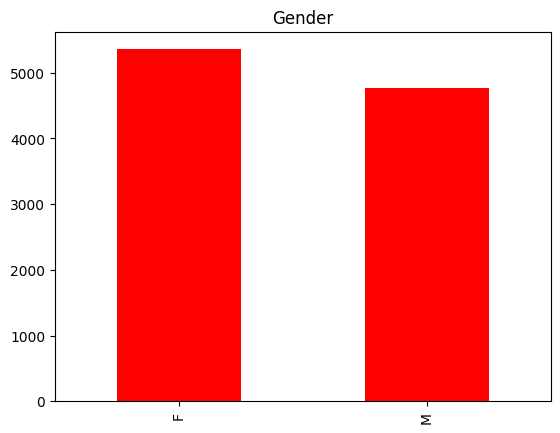

In [27]:
df['Gender'].value_counts().plot(kind="bar", color="Red", title="Gender")

In [21]:
df['Income_Category'].value_counts()


Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64

<AxesSubplot: title={'center': 'Education Level'}>

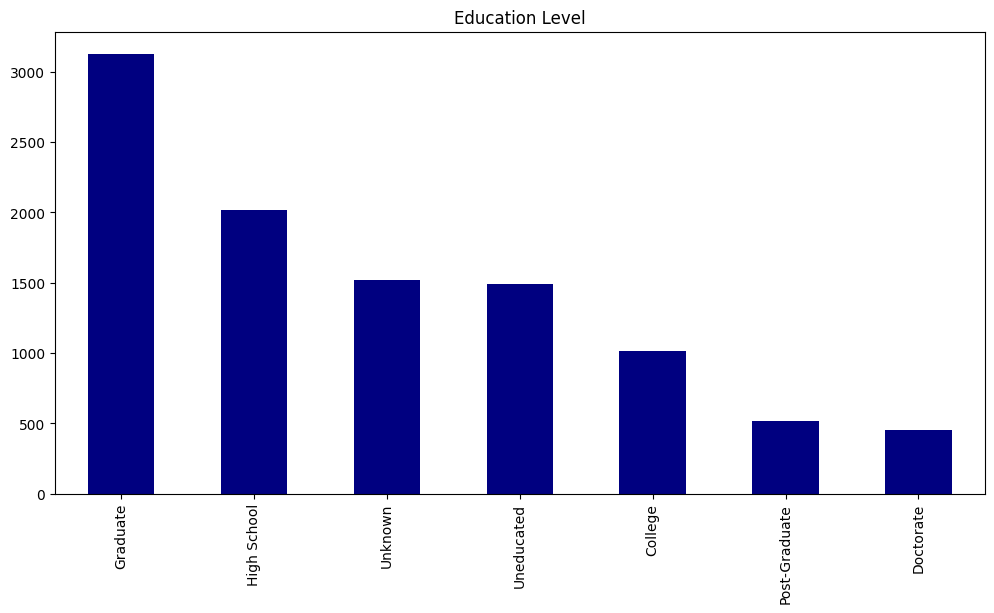

In [42]:
plt.figure(figsize=(12, 6))
df['Education_Level'].value_counts().plot(kind="bar", color="Navy", title="Education Level")

In [45]:
df_cust = pd.concat([df[['Customer_Age','Gender','Education_Level','Marital_Status','Income_Category','Attrition_Flag']]],axis=1)
df_cust.head(5)

,Customer_Age,Gender,Education_Level,Marital_Status,Income_Category,Attrition_Flag
0,45,M,High School,Married,$60K - $80K,Existing Customer
1,49,F,Graduate,Single,Less than $40K,Existing Customer
2,51,M,Graduate,Married,$80K - $120K,Existing Customer
3,40,F,High School,Unknown,Less than $40K,Existing Customer
4,40,M,Uneducated,Married,$60K - $80K,Existing Customer


In [46]:
df.select_dtypes(include='object').columns

Index(['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category'],
      dtype='object')

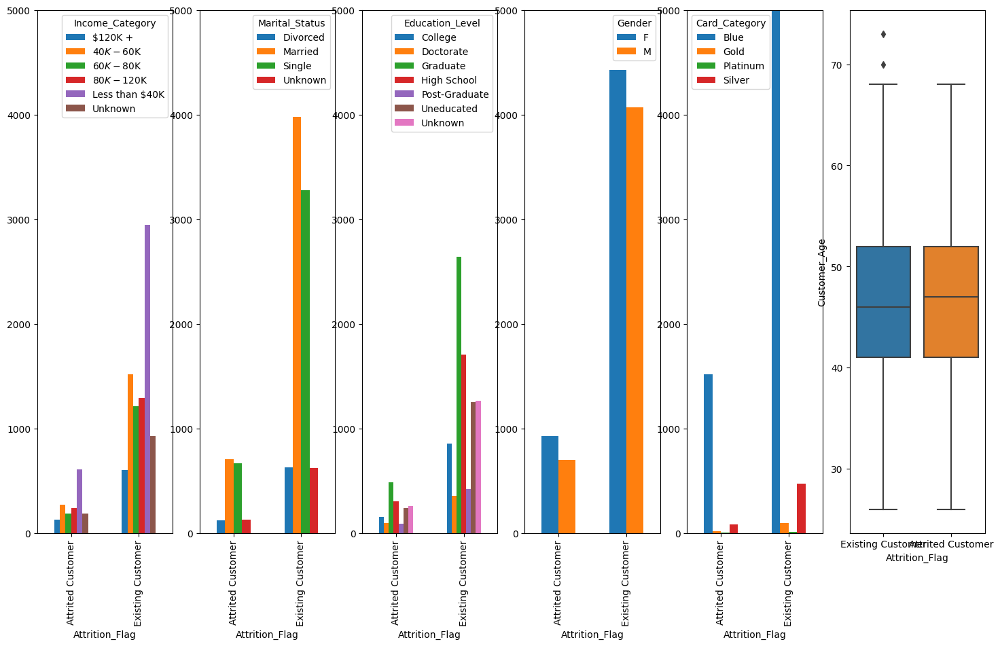

In [47]:
fig , ( ax, ax2, ax3, ax4, ax5 , ax6 ) = plt.subplots(ncols = 6, 
                                          figsize = (18,10))

## Bar Charts for categorical features

pd.crosstab(df['Attrition_Flag'],df['Income_Category']).plot(kind = 'bar', ax = ax, ylim = [0,5000])

pd.crosstab(df['Attrition_Flag'],df['Marital_Status']).plot(kind = 'bar', ax = ax2, ylim = [0,5000])

pd.crosstab(df['Attrition_Flag'],df['Education_Level']).plot(kind = 'bar', ax = ax3, ylim = [0,5000])

pd.crosstab(df['Attrition_Flag'],df['Gender']).plot(kind = 'bar', ax = ax4, ylim = [0,5000])

pd.crosstab(df['Attrition_Flag'],df['Card_Category']).plot(kind = 'bar', ax = ax5, ylim = [0,5000])

boxplot = sns.boxplot(data = df_cust, x = 'Attrition_Flag', y = 'Customer_Age', ax = ax6)

**Numeric**

In [61]:
#getting the numeric data 
numeric_data = df._get_numeric_data()
numeric_data.head()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Churn
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0


array([[<AxesSubplot: title={'center': 'Customer_Age'}>,
        <AxesSubplot: title={'center': 'Dependent_count'}>],
       [<AxesSubplot: title={'center': 'Months_on_book'}>,
        <AxesSubplot: title={'center': 'Total_Relationship_Count'}>],
       [<AxesSubplot: title={'center': 'Months_Inactive_12_mon'}>,
        <AxesSubplot: title={'center': 'Contacts_Count_12_mon'}>],
       [<AxesSubplot: title={'center': 'Credit_Limit'}>,
        <AxesSubplot: title={'center': 'Total_Revolving_Bal'}>],
       [<AxesSubplot: title={'center': 'Avg_Open_To_Buy'}>,
        <AxesSubplot: title={'center': 'Total_Amt_Chng_Q4_Q1'}>],
       [<AxesSubplot: title={'center': 'Total_Trans_Amt'}>,
        <AxesSubplot: title={'center': 'Total_Trans_Ct'}>],
       [<AxesSubplot: title={'center': 'Total_Ct_Chng_Q4_Q1'}>,
        <AxesSubplot: title={'center': 'Avg_Utilization_Ratio'}>],
       [<AxesSubplot: title={'center': 'Churn'}>, <AxesSubplot: >]],
      dtype=object)

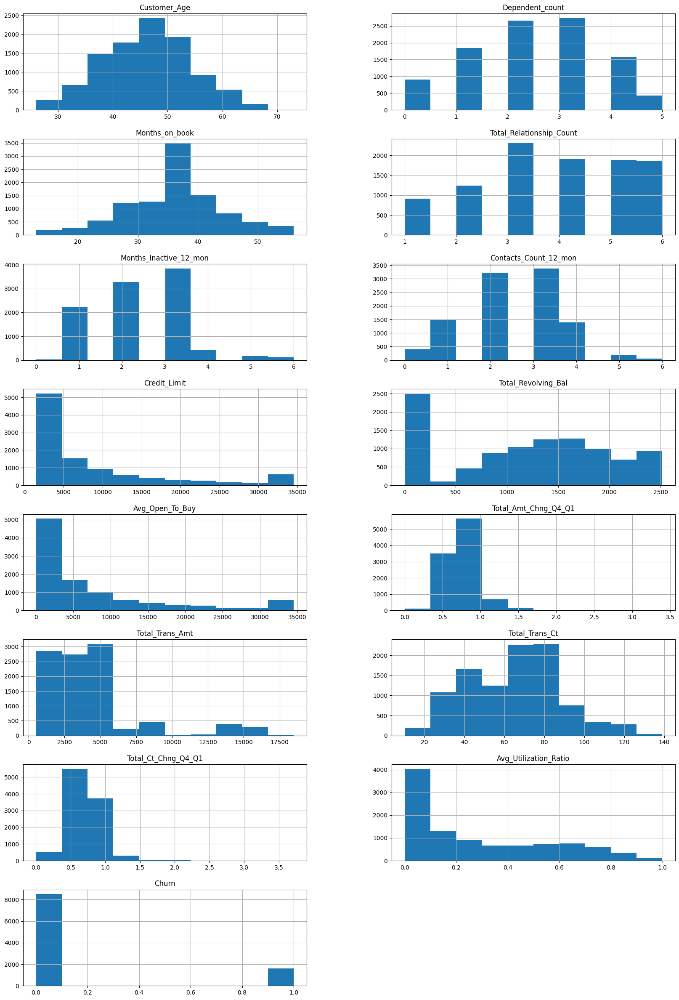

In [66]:
#distribution

numeric_data.hist(layout=(8,2),figsize=(20, 30))

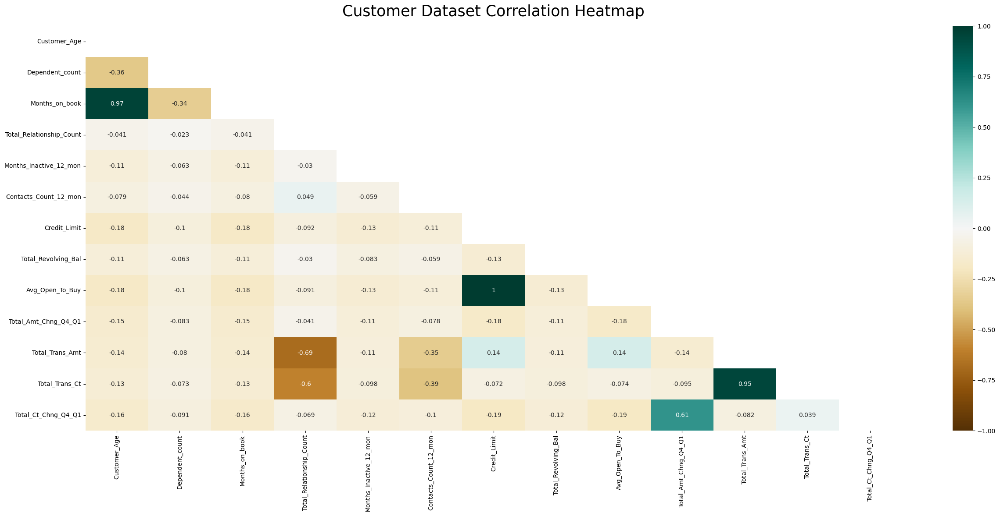

In [55]:
df_corr_matrix = numeric_data.iloc[:,:-1].corr()

#if correlation is low put 0 (for correlation matrix redability)
df_corr_matrix[abs(df_corr_matrix) < 0.1] = 0 

#plot the correlation matrix
plt.figure(figsize=(30, 12))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df_corr_matrix.corr(), dtype=np.bool_))
heatmap = sns.heatmap(df_corr_matrix.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG') #BrBG
heatmap.set_title('Customer Dataset Correlation Heatmap', fontdict={'fontsize':25}, pad=16);

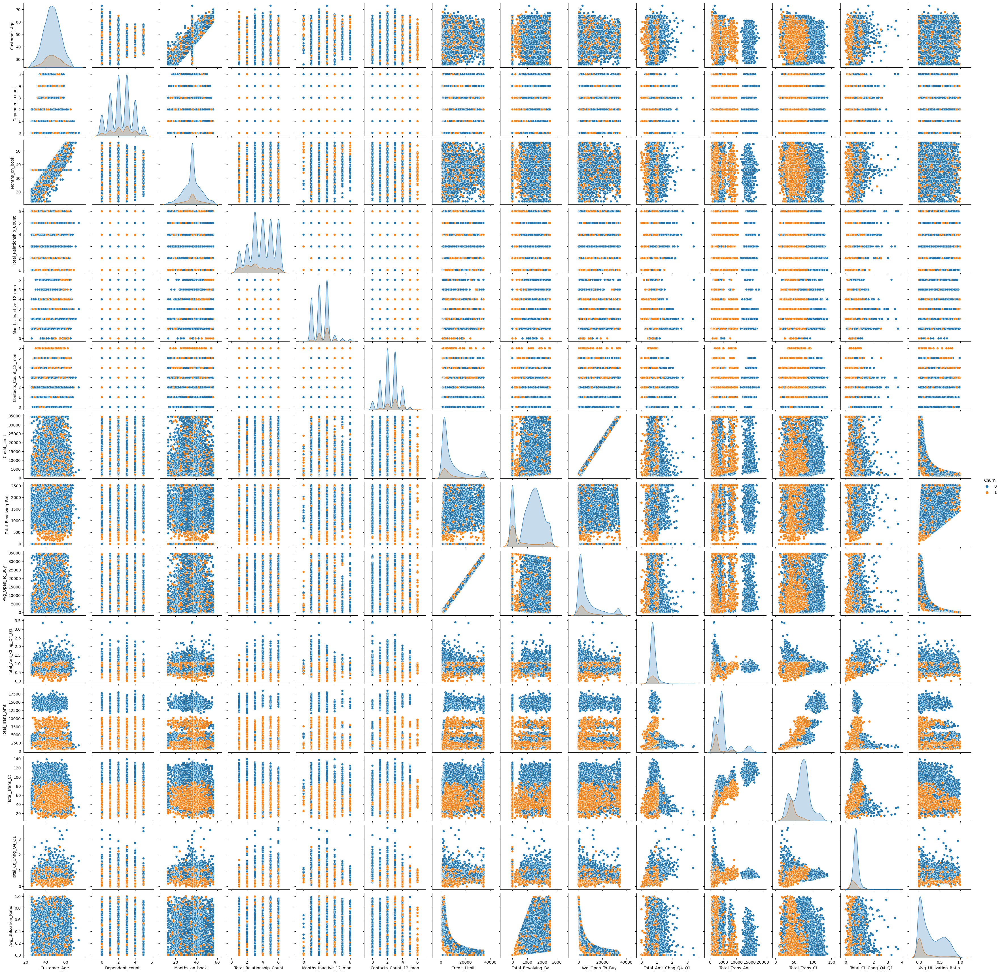

In [67]:
sns.pairplot(numeric_data, hue='Churn')

In [69]:
numeric_data.columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Churn'],
      dtype='object')

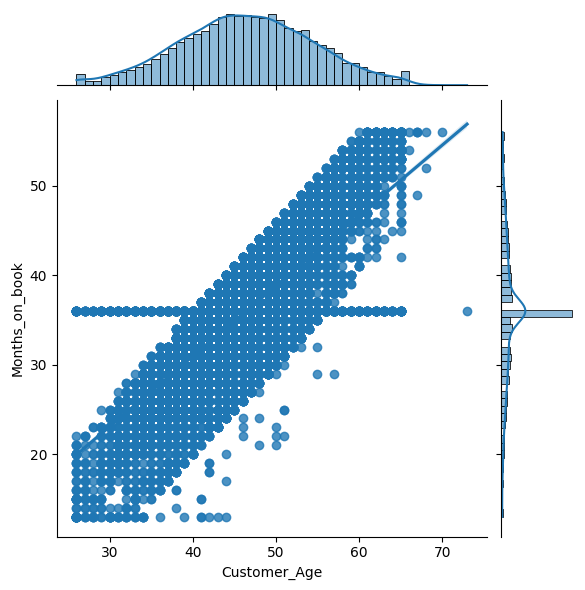

In [70]:
sns.jointplot(x='Customer_Age' , y='Months_on_book' , data=numeric_data, kind='reg')

In [71]:
def dist_plot_kde(df, ax, label, feature ,xlabel= None,  title= None):
    """
    Python function to plot the distribution of a feature for positive or negative label values
    df: dataframe
    ax: plot definition 
    label: label
    feature: feature
    title: title of the plot
    xlabel:  x axis label
    
    """
    #positive label
    ax = sns.kdeplot(df[feature].loc[(df[label] == 1)],
                     color="Red", shade = True)
    #negative label
    ax = sns.kdeplot(df[feature].loc[(df[label] == 0)],
                     ax =ax, color="Blue", shade= True, alpha= 0.2)
    
    #legend and other plot labels
    ax.legend([label,"Not " + label ],loc='upper right')
    ax.set_ylabel('Density')
    ax.set_xlabel(xlabel)
    ax.set_title(title)

    return 

C:\Users\eiman\AppData\Local\Temp\ipykernel_7408\3100829960.py:13: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


C:\Users\eiman\AppData\Local\Temp\ipykernel_7408\3100829960.py:16: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




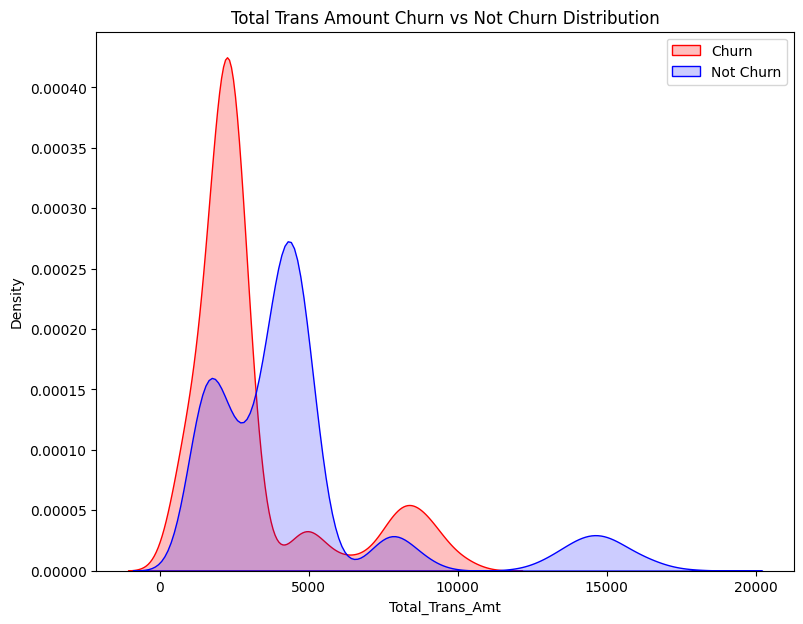

In [72]:
fig, ax = plt.subplots(figsize=(9,7))
dist_plot_kde(df = numeric_data,ax = ax,label = 'Churn', feature = "Total_Trans_Amt" ,xlabel= 'Total_Trans_Amt',  title= 'Total Trans Amount Churn vs Not Churn Distribution')

C:\Users\eiman\AppData\Local\Temp\ipykernel_7408\3100829960.py:13: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


C:\Users\eiman\AppData\Local\Temp\ipykernel_7408\3100829960.py:16: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




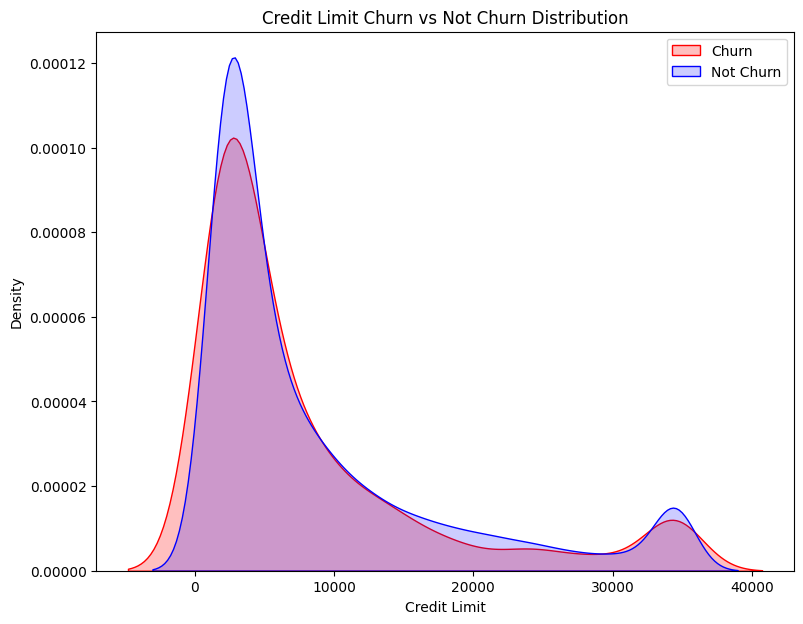

In [73]:
fig, ax = plt.subplots(figsize=(9,7))
dist_plot_kde(df = numeric_data,ax = ax,label = 'Churn', feature = "Credit_Limit" ,xlabel= 'Credit Limit',  title= 'Credit Limit Churn vs Not Churn Distribution')

# Model selection and evaluation












In [118]:
#encoding categorical features
le = LabelEncoder()

df['Gender'] = le.fit_transform(df.Gender)
df['Education_Level'] = le.fit_transform(df.Education_Level)
df['Marital_Status'] = le.fit_transform(df.Marital_Status)
df['Income_Category'] = le.fit_transform(df.Income_Category)
df['Card_Category'] = le.fit_transform(df.Card_Category)

In [120]:
# divide features and label , encode label
y = df['Churn'].values
X = df.drop(['Attrition_Flag','Churn'], axis = 1)

In [121]:
cat_ix = X.select_dtypes(include=['object', 'bool']).columns
num_ix = X.select_dtypes(include=['int64']).columns

In [122]:
#split train and test set
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size = 0.2, random_state = 90, stratify = y) 
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((8101, 19), (2026, 19), (8101,), (2026,))

In [99]:
# define models to test
def get_models():
    models, names = list(), list()
    # CART
    models.append(DecisionTreeClassifier())
    names.append('CART')
    # SVM
    models.append(SVC(gamma='scale'))
    names.append('SVM')
    # Bagging
    models.append(BaggingClassifier(n_estimators=100))
    names.append('BAG')
    # RF
    models.append(RandomForestClassifier(n_estimators=100))
    names.append('RF')
    # GBM
    models.append(GradientBoostingClassifier(n_estimators=100))
    names.append('GBM')

    # LR
    # models.append(LogisticRegression())
    # names.append('LR')
    return models, names

In [102]:
# evaluate a model
def evaluate_model(X, y, model):
    # define evaluation procedure
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    # evaluate model
    scores = cross_val_score(model, X, y, scoring='recall', cv=cv, n_jobs=-1)
    return scores

In [100]:
# define models
models, names = get_models()
results = list()

#define pipeline for categorical transformer 
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('encoder', OneHotEncoder(handle_unknown='ignore'))])


In [107]:
#smote for oversampling
smt = SMOTE(random_state=90)

for i in range(len(models)):
    # define steps
    steps = [('c',categorical_transformer,cat_ix), ('n',MinMaxScaler(),num_ix)]
    # one hot encode categorical, normalize numerical
    ct = ColumnTransformer(steps)
    # wrap the model i a pipeline
    pipeline = imbpipeline(steps=[('t',ct),('smt', smt),('m',models[i])])
    # evaluate the model and store results
    scores = evaluate_model(X_train, y_train, pipeline)
    results.append(scores)
    # summarize performance
    print('>%s %.3f (%.3f)' % (names[i], mean(scores), std(scores)))

>CART 0.835 (0.025)
>SVM 0.805 (0.036)
>BAG 0.882 (0.025)
>RF 0.855 (0.031)
>GBM 0.896 (0.024)


In [123]:
model = GradientBoostingClassifier()
model.fit(X_train, y_train)

GradientBoostingClassifier()

In [127]:
# make predictions for test data
y_pred = model.predict(X_test)
predictions = [round(value) for value in y_pred]
confusion_matrix(y_test,predictions)

array([[1684,   17],
       [  60,  265]], dtype=int64)

In [131]:
# evaluate predictions
pred_accuracy = accuracy_score(y_test, predictions)
pred_recall = metrics.recall_score (y_test, predictions)
pred_precision = metrics.precision_score (y_test, predictions)



print('Accuracy: ' f"{pred_accuracy:,.4%}")
print('Recall: ' f"{pred_recall:,.4%}")
print('Precision: ' f"{pred_precision:,.4%}")

Accuracy: 96.1994%
Recall: 81.5385%
Precision: 93.9716%
